### Import packages

# ** Am modificat codul, nu am modificatcomentariile **

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import copy
import math

%matplotlib inline

In [2]:
%pip install ydata-profiling
from ydata_profiling import ProfileReport

### Read data

In [3]:
data = pd.read_csv("Student Depression Dataset.csv", thousands=',', skipinitialspace=True)
#data = pd.read_csv("churn-bigml-80.csv", thousands=',', skipinitialspace=True)
data

,id,Gender,Age,City,Profession,Academic Pressure,Work Pressure,CGPA,Study Satisfaction,Job Satisfaction,Sleep Duration,Dietary Habits,Degree,Have you ever had suicidal thoughts ?,Work/Study Hours,Financial Stress,Family History of Mental Illness,Depression
0,2,Male,33.0,Visakhapatnam,Student,5.0,0.0,8.97,2.0,0.0,5-6 hours,Healthy,B.Pharm,Yes,3.0,1.0,No,1
1,8,Female,24.0,Bangalore,Student,2.0,0.0,5.90,5.0,0.0,5-6 hours,Moderate,BSc,No,3.0,2.0,Yes,0
2,26,Male,31.0,Srinagar,Student,3.0,0.0,7.03,5.0,0.0,Less than 5 hours,Healthy,BA,No,9.0,1.0,Yes,0
3,30,Female,28.0,Varanasi,Student,3.0,0.0,5.59,2.0,0.0,7-8 hours,Moderate,BCA,Yes,4.0,5.0,Yes,1
4,32,Female,25.0,Jaipur,Student,4.0,0.0,8.13,3.0,0.0,5-6 hours,Moderate,M.Tech,Yes,1.0,1.0,No,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27896,140685,Female,27.0,Surat,Student,5.0,0.0,5.75,5.0,0.0,5-6 hours,Unhealthy,Class 12,Yes,7.0,1.0,Yes,0
27897,140686,Male,27.0,Ludhiana,Student,2.0,0.0,9.40,3.0,0.0,Less than 5 hours,Healthy,MSc,No,0.0,3.0,Yes,0
27898,140689,Male,31.0,Faridabad,Student,3.0,0.0,6.61,4.0,0.0,5-6 hours,Unhealthy,MD,No,12.0,2.0,No,0
27899,140690,Female,18.0,Ludhiana,Student,5.0,0.0,6.88,2.0,0.0,Less than 5 hours,Healthy,Class 12,Yes,10.0,5.0,No,1


### Drop empty lines in data and remove NAN's

In [4]:
data = data.dropna()
data

,id,Gender,Age,City,Profession,Academic Pressure,Work Pressure,CGPA,Study Satisfaction,Job Satisfaction,Sleep Duration,Dietary Habits,Degree,Have you ever had suicidal thoughts ?,Work/Study Hours,Financial Stress,Family History of Mental Illness,Depression
0,2,Male,33.0,Visakhapatnam,Student,5.0,0.0,8.97,2.0,0.0,5-6 hours,Healthy,B.Pharm,Yes,3.0,1.0,No,1
1,8,Female,24.0,Bangalore,Student,2.0,0.0,5.90,5.0,0.0,5-6 hours,Moderate,BSc,No,3.0,2.0,Yes,0
2,26,Male,31.0,Srinagar,Student,3.0,0.0,7.03,5.0,0.0,Less than 5 hours,Healthy,BA,No,9.0,1.0,Yes,0
3,30,Female,28.0,Varanasi,Student,3.0,0.0,5.59,2.0,0.0,7-8 hours,Moderate,BCA,Yes,4.0,5.0,Yes,1
4,32,Female,25.0,Jaipur,Student,4.0,0.0,8.13,3.0,0.0,5-6 hours,Moderate,M.Tech,Yes,1.0,1.0,No,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27896,140685,Female,27.0,Surat,Student,5.0,0.0,5.75,5.0,0.0,5-6 hours,Unhealthy,Class 12,Yes,7.0,1.0,Yes,0
27897,140686,Male,27.0,Ludhiana,Student,2.0,0.0,9.40,3.0,0.0,Less than 5 hours,Healthy,MSc,No,0.0,3.0,Yes,0
27898,140689,Male,31.0,Faridabad,Student,3.0,0.0,6.61,4.0,0.0,5-6 hours,Unhealthy,MD,No,12.0,2.0,No,0
27899,140690,Female,18.0,Ludhiana,Student,5.0,0.0,6.88,2.0,0.0,Less than 5 hours,Healthy,Class 12,Yes,10.0,5.0,No,1


### Reset the index for potentially removed rows in data

In [5]:
data = data.reset_index(drop=True)

## EDA - Exploratory Data Analysis

### View data statistics - short format

In [6]:
data.describe()

,id,Age,Academic Pressure,Work Pressure,CGPA,Study Satisfaction,Job Satisfaction,Work/Study Hours,Financial Stress,Depression
count,27898.000000,27898.000000,27898.000000,27898.000000,27898.000000,27898.000000,27898.000000,27898.000000,27898.000000,27898.000000
mean,70442.953402,25.822174,3.141336,0.000430,7.656160,2.943974,0.000681,7.156570,3.139867,0.585526
std,40642.015063,4.905651,1.381462,0.043994,1.470708,1.361122,0.044397,3.707598,1.437347,0.492640
min,2.000000,18.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
25%,35040.750000,21.000000,2.000000,0.000000,6.290000,2.000000,0.000000,4.000000,2.000000,0.000000
50%,70689.000000,25.000000,3.000000,0.000000,7.770000,3.000000,0.000000,8.000000,3.000000,1.000000
75%,105824.750000,30.000000,4.000000,0.000000,8.920000,4.000000,0.000000,10.000000,4.000000,1.000000
max,140699.000000,59.000000,5.000000,5.000000,10.000000,5.000000,4.000000,12.000000,5.000000,1.000000


### View data statistics - long format

In [7]:
profile = ProfileReport(data, title="Student Depression")

In [8]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 18/18 [00:01<00:00, 12.30it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Important: We have 85.8% samples with no churn and 14.2% churn samples in our dataset

### Change categorical string/boolean columns to categorical integer columns

In [9]:
# Important: avem ~41.45% probe fără depresie și ~58.55% probe cu depresie în dataset
# Convertim coloanele categorice din șiruri/text în coduri întregi

# lista coloanelor categorice
cat_cols = [
    'Gender',
    'City',
    'Profession',
    'Dietary Habits',
    'Degree',
    'Sleep Duration',
    'Have you ever had suicidal thoughts ?',
    'Family History of Mental Illness'
]

for col in cat_cols:
    data[col] = data[col].astype('category').cat.codes

# target-ul
data['Depression'] = data['Depression'].astype('category').cat.codes


In [10]:
data

,id,Gender,Age,City,Profession,Academic Pressure,Work Pressure,CGPA,Study Satisfaction,Job Satisfaction,Sleep Duration,Dietary Habits,Degree,Have you ever had suicidal thoughts ?,Work/Study Hours,Financial Stress,Family History of Mental Illness,Depression
0,2,1,33.0,51,11,5.0,0.0,8.97,2.0,0.0,0,0,3,1,3.0,1.0,0,1
1,8,0,24.0,3,11,2.0,0.0,5.90,5.0,0.0,0,1,10,0,3.0,2.0,1,0
2,26,1,31.0,44,11,3.0,0.0,7.03,5.0,0.0,2,0,5,0,9.0,1.0,1,0
3,30,0,28.0,49,11,3.0,0.0,5.59,2.0,0.0,1,1,7,1,4.0,5.0,1,1
4,32,0,25.0,16,11,4.0,0.0,8.13,3.0,0.0,0,1,17,1,1.0,1.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27893,140685,0,27.0,45,11,5.0,0.0,5.75,5.0,0.0,0,3,11,1,7.0,1.0,1,0
27894,140686,1,27.0,25,11,2.0,0.0,9.40,3.0,0.0,2,0,25,0,0.0,3.0,1,0
27895,140689,1,31.0,9,11,3.0,0.0,6.61,4.0,0.0,0,3,22,0,12.0,2.0,0,0
27896,140690,0,18.0,25,11,5.0,0.0,6.88,2.0,0.0,2,0,11,1,10.0,5.0,0,1


### Create x and y from original data

In [11]:
x_data = data.drop(columns=['Depression'])
x_data

,id,Gender,Age,City,Profession,Academic Pressure,Work Pressure,CGPA,Study Satisfaction,Job Satisfaction,Sleep Duration,Dietary Habits,Degree,Have you ever had suicidal thoughts ?,Work/Study Hours,Financial Stress,Family History of Mental Illness
0,2,1,33.0,51,11,5.0,0.0,8.97,2.0,0.0,0,0,3,1,3.0,1.0,0
1,8,0,24.0,3,11,2.0,0.0,5.90,5.0,0.0,0,1,10,0,3.0,2.0,1
2,26,1,31.0,44,11,3.0,0.0,7.03,5.0,0.0,2,0,5,0,9.0,1.0,1
3,30,0,28.0,49,11,3.0,0.0,5.59,2.0,0.0,1,1,7,1,4.0,5.0,1
4,32,0,25.0,16,11,4.0,0.0,8.13,3.0,0.0,0,1,17,1,1.0,1.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27893,140685,0,27.0,45,11,5.0,0.0,5.75,5.0,0.0,0,3,11,1,7.0,1.0,1
27894,140686,1,27.0,25,11,2.0,0.0,9.40,3.0,0.0,2,0,25,0,0.0,3.0,1
27895,140689,1,31.0,9,11,3.0,0.0,6.61,4.0,0.0,0,3,22,0,12.0,2.0,0
27896,140690,0,18.0,25,11,5.0,0.0,6.88,2.0,0.0,2,0,11,1,10.0,5.0,0


In [12]:
y_data = data['Depression']
y_data

,Depression
0,1
1,0
2,0
3,1
4,0
...,...
27893,0
27894,0
27895,0
27896,1


### View features against Churn

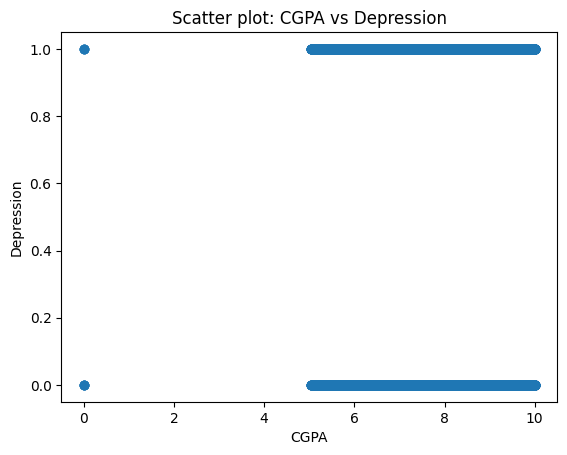

In [13]:
plt.scatter(x_data['CGPA'], y_data)
plt.xlabel('CGPA')
plt.ylabel('Depression')
plt.title('Scatter plot: CGPA vs Depression')
plt.show()


### Split data into training and validation datasets: Default 80% train, 20% validation

In [14]:
x_train, x_validation, y_train, y_validation = train_test_split(x_data, y_data, test_size=0.2, random_state=42, stratify=y_data)

### Visualize how one sample looks like

In [15]:
x_train = x_train.to_numpy()
x_validation = x_validation.to_numpy()
y_train = y_train.to_numpy()
y_validation = y_validation.to_numpy()

In [16]:
x_train[0]

array([1.10738e+05, 0.00000e+00, 1.80000e+01, 3.80000e+01, 1.10000e+01,
       3.00000e+00, 0.00000e+00, 9.96000e+00, 5.00000e+00, 0.00000e+00,
       1.00000e+00, 0.00000e+00, 1.10000e+01, 1.00000e+00, 2.00000e+00,
       4.00000e+00, 1.00000e+00])

### Visualize the nuber of training samples and number of validation samples

In [17]:
len(y_train), len(y_validation)

(22318, 5580)

### Visualize the number of no churn vs churn samples in training dataset

#### Having 85.8% samples with no churn and 14.2% samples with churn in our dataset
#### So we have a ratio of 6 no churn samples to 1 churn sample
#### Our training and validation dataset should respect this ratio approximately

In [18]:
np.unique(y_train, return_counts=True)

(array([0, 1], dtype=int8), array([ 9250, 13068]))

#### 456 samples of 0 (no churn) and 78 samples of 1 (churn)
#### 78 * 6 = 468

### Visualize the number of no churn vs churn samples in validation dataset

#### 116 samples of 0 (no churn) and 17 samples of 1 (churn)
#### 17 * 6 = 102

In [19]:
np.unique(y_validation, return_counts=True)

(array([0, 1], dtype=int8), array([2313, 3267]))

### Standardization - mean and standard deviation calculation

In [20]:
mean   = np.mean(x_train, axis=0)
sigma  = np.std(x_train, axis=0)

In [21]:
x_train = (x_train - mean) / sigma

### Very important! Validation dataset MUST BE standardized using mean and standard deviation calculated from the training dataset

In [22]:
x_validation = (x_validation - mean) / sigma

### View min and max values after standardization from training dataset

In [23]:
x_train.min(), x_train.max()

(np.float64(-42.84959614433412), np.float64(138.70363362882))

### View min and max values after standardization from training dataset

In [24]:
x_validation.min(), x_validation.max()

(np.float64(-42.84959614433412), np.float64(138.70363362882))

### Logistic Regression implementation

In [25]:
def sigmoid(x):
    g = 1 / (1 + np.exp(-x))
    return g

#### Examples of using sigmoid values

In [26]:
sigmoid(1)

np.float64(0.7310585786300049)

In [27]:
sigmoid(0)

np.float64(0.5)

In [28]:
sigmoid(-1)

np.float64(0.2689414213699951)

In [29]:
sigmoid(-1000)

<ipython-input-25-0b81d26b1f5a>:2: RuntimeWarning: overflow encountered in exp
  g = 1 / (1 + np.exp(-x))


np.float64(0.0)

In [30]:
sigmoid(100)

np.float64(1.0)

In [31]:
def compute_cost(X, y, w, b, lambda_=1):
    m = X.shape[0]
    cost = 0.0
    for i in range(m):
        z_i = np.dot(X[i],w) + b
        f_wb_i = sigmoid(z_i)
        cost +=  -y[i] * np.log(f_wb_i) - (1 - y[i]) * np.log(1 - f_wb_i)

    cost = cost / m
    return cost

In [32]:
def compute_gradient(X, y, w, b, lambda_=1):
    m,n = X.shape
    dj_dw = np.zeros((n,))                           #(n,)
    dj_db = 0.

    for i in range(m):
        f_wb_i = sigmoid(np.dot(X[i], w) + b)          #(n,)(n,)=scalar
        err_i  = f_wb_i  - y[i]                       #scalar
        for j in range(n):
            dj_dw[j] += err_i * X[i,j]      #scalar
        dj_db += err_i
    dj_dw = dj_dw/m                                   #(n,)
    dj_db = dj_db/m                                   #scalar

    return dj_db, dj_dw

In [33]:
def gradient_descent(x_train, y_train, x_validation, y_validation, w_in, b_in, cost_function, gradient_function, alpha, num_iters, lambda_=1):
    # number of training examples
    m = len(x_train)

    # An array to store cost J and w's at each iteration primarily for graphing later
    J_train_history = []
    J_valid_history = []
    w_history = []

    best_train_score = cost_function(x_train, y_train, w_in, b_in, lambda_)
    best_validation_score = cost_valid =  compute_cost(x_validation, y_validation, w_in, b_in, lambda_)
    best_w_in_train = copy.deepcopy(w_in)
    best_b_train = copy.deepcopy(b_in)
    best_w_in_valid = copy.deepcopy(w_in)
    best_b_valid = copy.deepcopy(b_in)

    for i in range(num_iters):

        # Calculate the gradient and update the parameters
        dj_db, dj_dw = gradient_function(x_train, y_train, w_in, b_in, lambda_)

        # Update Parameters using w, b, alpha and gradient
        w_in = w_in - alpha * dj_dw
        b_in = b_in - alpha * dj_db

        cost_train =  cost_function(x_train, y_train, w_in, b_in, lambda_)
        J_train_history.append(cost_train)

        cost_valid =  compute_cost(x_validation, y_validation, w_in, b_in, lambda_)
        J_valid_history.append(cost_valid)

        if best_train_score > cost_train:
            best_train_score = cost_train
            np.save(f'model/best_train_w_in.npy', w_in)    # .npy extension is added if not given
            np.save(f'model/best_train_b.npy', b_in)


        if best_validation_score > cost_valid:
            best_validation_score = cost_valid
            np.save(f'model/best_valid_w_in.npy', w_in)    # .npy extension is added if not given
            np.save(f'model/best_valid_b.npy', b_in)

        # Print cost every at intervals 10 times or as many iterations if < 10
        if i % math.ceil(num_iters/10) == 0 or i == (num_iters-1):
            w_history.append(w_in)
            print(f"Iteration {i:4}: Cost Train: {float(J_train_history[-1].squeeze()):f} \t  Cost Validation: {float(J_valid_history[-1].squeeze()):f}")

    return w_in, b_in, J_train_history, J_valid_history, w_history #return w and J,w history for graphing

In [34]:
import os
os.makedirs('model', exist_ok=True)
initial_w = np.zeros(len(x_train[0]))
initial_b = 0

# Some gradient descent settings
iterations = 1000
alpha = 3
lambda_ = 0

w_final, b_final, J_train_history, J_valid_history, _ = gradient_descent(x_train=x_train, y_train=y_train, x_validation=x_validation, y_validation=y_validation, w_in=initial_w, b_in=initial_b, cost_function=compute_cost, gradient_function=compute_gradient, alpha=alpha, num_iters=iterations, lambda_=lambda_)

Iteration    0: Cost Train: 0.376848 	  Cost Validation: 0.381960
Iteration  100: Cost Train: 0.350586 	  Cost Validation: 0.358638
Iteration  200: Cost Train: 0.350586 	  Cost Validation: 0.358922
Iteration  300: Cost Train: 0.350585 	  Cost Validation: 0.359095
Iteration  400: Cost Train: 0.350585 	  Cost Validation: 0.359220
Iteration  500: Cost Train: 0.350585 	  Cost Validation: 0.359318
Iteration  600: Cost Train: 0.350585 	  Cost Validation: 0.359398
Iteration  700: Cost Train: 0.350585 	  Cost Validation: 0.359466
Iteration  800: Cost Train: 0.350585 	  Cost Validation: 0.359525
Iteration  900: Cost Train: 0.350585 	  Cost Validation: 0.359577
Iteration  999: Cost Train: 0.350585 	  Cost Validation: 0.359624


In [35]:
best_w_final = np.load('model/best_valid_w_in.npy')
best_b_final = np.load('model/best_valid_b.npy')

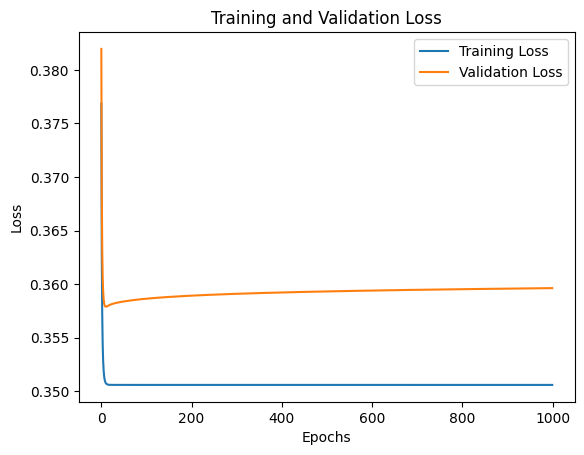

In [36]:
# Generate a sequence of integers to represent the epoch numbers
#epochs = range(1, iterations+1)

# Plot and label the training and validation loss values
plt.plot(J_train_history, label='Training Loss')
plt.plot(J_valid_history, label='Validation Loss')

# Add in a title and axes labels
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')

# Set the tick locations
#plt.xticks(np.arange(0, iterations+1, 2))

# Display the plot
plt.legend(loc='best')
plt.show()

In [37]:
def predict(X, w, b):
    # number of training examples
    m, n = X.shape
    p = np.zeros(m)

    for i in range(m):
        z_wb = 0
        # Loop over each feature
        for j in range(n):
            # Add the corresponding term to z_wb
            z_wb += X[i][j] * w[j]

        # Add bias term
        z_wb += b

        # Calculate the prediction for this example
        f_wb = sigmoid(z_wb)

        # Apply the threshold
        p[i] = f_wb >= 0.5

    return p

In [38]:
y_predicted = predict(x_train, w_final, b_final)

In [39]:
y_train.shape

(22318,)

In [40]:
y_train.reshape(-1).shape, y_predicted.shape

((22318,), (22318,))

In [41]:
(y_train.reshape(-1) == y_predicted).sum()

np.int64(18896)

In [42]:
x_train.shape
x_train.shape

(22318, 17)

In [43]:
y_train = y_train.reshape(-1)

In [44]:
type(y_predicted)

numpy.ndarray

In [45]:
def metrics_computations(x:np.array,
                         y_true:np.array,
                         y_predicted: np.array):
    total_number_of_samples = x.shape[0]
    accuracy = (y_true == y_predicted).sum() / total_number_of_samples
    true_positive = ((y_predicted == 1) & (y_true == 1)).sum()
    false_positive = ((y_predicted == 1) & (y_true == 0)).sum()
    false_negative = ((y_predicted == 0) & (y_true == 1)).sum()
    true_negative = ((y_predicted == 0) & (y_true == 0)).sum()

    precision = true_positive / (true_positive + false_positive)
    recall = true_positive / (true_positive + false_negative)
    specificity = true_negative / (true_negative + false_positive)
    f1_score = (2 * precision * recall) / (precision + recall)

    false_negative_rate = false_negative / (false_negative + true_positive)
    false_positive_rate = false_positive / (false_positive + true_negative)

    return (accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate)

In [46]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_train,
                                                                                                                     y_true=y_train,
                                                                                                                     y_predicted=y_predicted)

In [47]:
print(f"[TRAIN] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[TRAIN] Accuracy: 84.67% 
 Precision: 85.66% 
 Recall: 88.66% 
 F1 Score: 87.13% 
 Specificity: 79.03% 
 False Positive Rate: 20.97% 
 False Negative Rate: 11.34%


In [48]:
y_predicted_validation = predict(x_validation, w_final, b_final)

In [49]:
y_validation = y_validation.reshape(-1)

In [50]:
for i, j in zip(y_validation, y_predicted_validation):
    print(i, j)

0 1.0
1 1.0
0 0.0
1 0.0
1 1.0
0 1.0
0 0.0
1 1.0
1 1.0
0 0.0
0 0.0
1 0.0
0 0.0
1 1.0
1 1.0
1 1.0
1 1.0
1 1.0
1 1.0
1 1.0
1 1.0
1 0.0
1 1.0
1 1.0
1 1.0
0 0.0
0 0.0
1 1.0
1 0.0
1 1.0
0 0.0
1 1.0
1 1.0
1 1.0
1 1.0
1 1.0
0 1.0
0 0.0
0 0.0
1 1.0
0 0.0
1 1.0
0 1.0
0 0.0
1 1.0
1 1.0
0 0.0
1 1.0
0 0.0
1 1.0
1 0.0
0 0.0
1 1.0
1 1.0
0 0.0
1 1.0
1 1.0
1 1.0
0 0.0
0 0.0
1 1.0
0 0.0
0 1.0
0 0.0
1 1.0
0 0.0
0 0.0
1 0.0
0 0.0
1 1.0
0 0.0
1 1.0
0 0.0
1 1.0
1 1.0
1 1.0
0 1.0
0 0.0
1 1.0
0 0.0
0 1.0
0 0.0
0 0.0
1 1.0
1 1.0
1 1.0
1 1.0
0 0.0
1 1.0
0 0.0
1 1.0
1 1.0
0 0.0
0 1.0
1 1.0
1 0.0
1 1.0
1 1.0
0 1.0
0 0.0
0 0.0
1 1.0
1 1.0
1 1.0
0 0.0
1 1.0
1 1.0
1 1.0
0 0.0
0 0.0
1 1.0
1 1.0
0 0.0
1 1.0
0 0.0
0 0.0
0 1.0
0 0.0
0 0.0
1 1.0
0 0.0
0 0.0
1 0.0
0 0.0
1 1.0
1 1.0
1 1.0
0 0.0
1 1.0
0 0.0
0 0.0
0 1.0
1 0.0
1 1.0
1 1.0
0 1.0
1 1.0
0 0.0
1 1.0
0 0.0
1 0.0
1 1.0
0 0.0
0 0.0
0 0.0
0 0.0
1 1.0
0 0.0
1 1.0
1 1.0
0 1.0
0 1.0
1 1.0
1 0.0
0 0.0
1 1.0
1 1.0
1 1.0
1 1.0
0 0.0
0 0.0
0 1.0
1 1.0
1 1.0
0 0.0
1 1.0
0 0.

In [51]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_validation,
                                                                                                                     y_true=y_validation,
                                                                                                                     y_predicted=y_predicted_validation)

In [52]:
print(f"[Valid] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[Valid] Accuracy: 84.48% 
 Precision: 85.68% 
 Recall: 88.25% 
 F1 Score: 86.94% 
 Specificity: 79.16% 
 False Positive Rate: 20.84% 
 False Negative Rate: 11.75%


### Analyze the feature importance

<Axes: ylabel='Feature'>

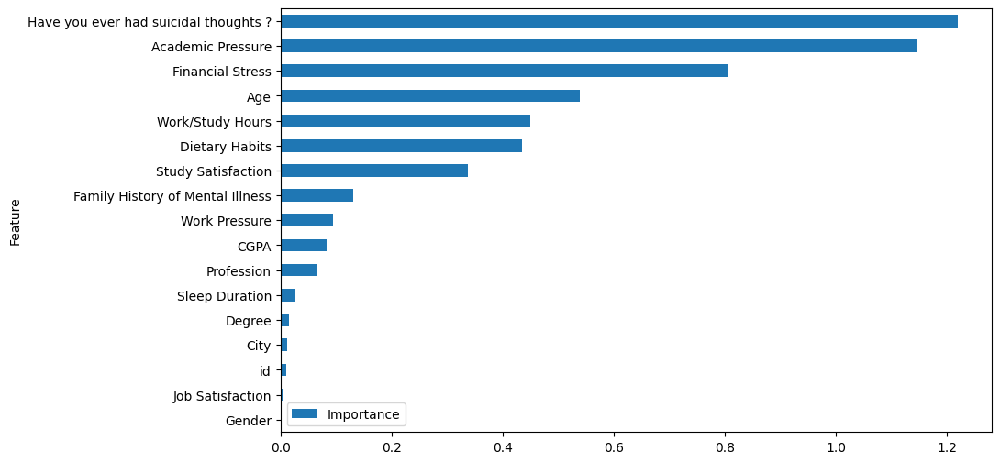

In [53]:
coefficients = copy.deepcopy(w_final)

feature_importance = pd.DataFrame({'Feature': x_data.columns.values, 'Importance': np.abs(coefficients)})
feature_importance = feature_importance.sort_values('Importance', ascending=True)
feature_importance.plot(x='Feature', y='Importance', kind='barh', figsize=(10, 6))

### Add polynomial features for improving model capacity

In [54]:
#pip install scikit-learn
from sklearn import preprocessing

In [55]:
poly = preprocessing.PolynomialFeatures(2, interaction_only=False, include_bias=False)

In [56]:
poly_values = poly.fit_transform(x_data)
poly_values

array([[2.00000e+00, 1.00000e+00, 3.30000e+01, ..., 1.00000e+00,
        0.00000e+00, 0.00000e+00],
       [8.00000e+00, 0.00000e+00, 2.40000e+01, ..., 4.00000e+00,
        2.00000e+00, 1.00000e+00],
       [2.60000e+01, 1.00000e+00, 3.10000e+01, ..., 1.00000e+00,
        1.00000e+00, 1.00000e+00],
       ...,
       [1.40689e+05, 1.00000e+00, 3.10000e+01, ..., 4.00000e+00,
        0.00000e+00, 0.00000e+00],
       [1.40690e+05, 0.00000e+00, 1.80000e+01, ..., 2.50000e+01,
        0.00000e+00, 0.00000e+00],
       [1.40699e+05, 1.00000e+00, 2.70000e+01, ..., 9.00000e+00,
        3.00000e+00, 1.00000e+00]])

In [57]:
poly_column_names = list(poly.get_feature_names_out(x_data.columns))
poly_column_names

['id',
 'Gender',
 'Age',
 'City',
 'Profession',
 'Academic Pressure',
 'Work Pressure',
 'CGPA',
 'Study Satisfaction',
 'Job Satisfaction',
 'Sleep Duration',
 'Dietary Habits',
 'Degree',
 'Have you ever had suicidal thoughts ?',
 'Work/Study Hours',
 'Financial Stress',
 'Family History of Mental Illness',
 'id^2',
 'id Gender',
 'id Age',
 'id City',
 'id Profession',
 'id Academic Pressure',
 'id Work Pressure',
 'id CGPA',
 'id Study Satisfaction',
 'id Job Satisfaction',
 'id Sleep Duration',
 'id Dietary Habits',
 'id Degree',
 'id Have you ever had suicidal thoughts ?',
 'id Work/Study Hours',
 'id Financial Stress',
 'id Family History of Mental Illness',
 'Gender^2',
 'Gender Age',
 'Gender City',
 'Gender Profession',
 'Gender Academic Pressure',
 'Gender Work Pressure',
 'Gender CGPA',
 'Gender Study Satisfaction',
 'Gender Job Satisfaction',
 'Gender Sleep Duration',
 'Gender Dietary Habits',
 'Gender Degree',
 'Gender Have you ever had suicidal thoughts ?',
 'Gender Wo

In [58]:
x_data = pd.DataFrame(poly_values, columns=poly_column_names)
x_data

,id,Gender,Age,City,Profession,Academic Pressure,Work Pressure,CGPA,Study Satisfaction,Job Satisfaction,...,Have you ever had suicidal thoughts ?^2,Have you ever had suicidal thoughts ? Work/Study Hours,Have you ever had suicidal thoughts ? Financial Stress,Have you ever had suicidal thoughts ? Family History of Mental Illness,Work/Study Hours^2,Work/Study Hours Financial Stress,Work/Study Hours Family History of Mental Illness,Financial Stress^2,Financial Stress Family History of Mental Illness,Family History of Mental Illness^2
0,2.0,1.0,33.0,51.0,11.0,5.0,0.0,8.97,2.0,0.0,...,1.0,3.0,1.0,0.0,9.0,3.0,0.0,1.0,0.0,0.0
1,8.0,0.0,24.0,3.0,11.0,2.0,0.0,5.90,5.0,0.0,...,0.0,0.0,0.0,0.0,9.0,6.0,3.0,4.0,2.0,1.0
2,26.0,1.0,31.0,44.0,11.0,3.0,0.0,7.03,5.0,0.0,...,0.0,0.0,0.0,0.0,81.0,9.0,9.0,1.0,1.0,1.0
3,30.0,0.0,28.0,49.0,11.0,3.0,0.0,5.59,2.0,0.0,...,1.0,4.0,5.0,1.0,16.0,20.0,4.0,25.0,5.0,1.0
4,32.0,0.0,25.0,16.0,11.0,4.0,0.0,8.13,3.0,0.0,...,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27893,140685.0,0.0,27.0,45.0,11.0,5.0,0.0,5.75,5.0,0.0,...,1.0,7.0,1.0,1.0,49.0,7.0,7.0,1.0,1.0,1.0
27894,140686.0,1.0,27.0,25.0,11.0,2.0,0.0,9.40,3.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,3.0,1.0
27895,140689.0,1.0,31.0,9.0,11.0,3.0,0.0,6.61,4.0,0.0,...,0.0,0.0,0.0,0.0,144.0,24.0,0.0,4.0,0.0,0.0
27896,140690.0,0.0,18.0,25.0,11.0,5.0,0.0,6.88,2.0,0.0,...,1.0,10.0,5.0,0.0,100.0,50.0,0.0,25.0,0.0,0.0


In [59]:
x_data.columns

Index(['id', 'Gender', 'Age', 'City', 'Profession', 'Academic Pressure',
       'Work Pressure', 'CGPA', 'Study Satisfaction', 'Job Satisfaction',
       ...
       'Have you ever had suicidal thoughts ?^2',
       'Have you ever had suicidal thoughts ? Work/Study Hours',
       'Have you ever had suicidal thoughts ? Financial Stress',
       'Have you ever had suicidal thoughts ? Family History of Mental Illness',
       'Work/Study Hours^2', 'Work/Study Hours Financial Stress',
       'Work/Study Hours Family History of Mental Illness',
       'Financial Stress^2',
       'Financial Stress Family History of Mental Illness',
       'Family History of Mental Illness^2'],
      dtype='object', length=170)

### Split data into training and validation datasets: Default 80% train, 20% validation

In [60]:
x_train, x_validation, y_train, y_validation = train_test_split(x_data, y_data, test_size=0.2, random_state=42, stratify=y_data)

In [61]:
x_train = x_train.to_numpy()
x_validation = x_validation.to_numpy()
y_train = y_train.to_numpy()
y_validation = y_validation.to_numpy()

### Visualize how one sample looks like

In [62]:
x_train[0]

array([1.10738000e+05, 0.00000000e+00, 1.80000000e+01, 3.80000000e+01,
       1.10000000e+01, 3.00000000e+00, 0.00000000e+00, 9.96000000e+00,
       5.00000000e+00, 0.00000000e+00, 1.00000000e+00, 0.00000000e+00,
       1.10000000e+01, 1.00000000e+00, 2.00000000e+00, 4.00000000e+00,
       1.00000000e+00, 1.22629046e+10, 0.00000000e+00, 1.99328400e+06,
       4.20804400e+06, 1.21811800e+06, 3.32214000e+05, 0.00000000e+00,
       1.10295048e+06, 5.53690000e+05, 0.00000000e+00, 1.10738000e+05,
       0.00000000e+00, 1.21811800e+06, 1.10738000e+05, 2.21476000e+05,
       4.42952000e+05, 1.10738000e+05, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 3.24000000e+02, 6.84000000e+02,
       1.98000000e+02, 5.40000000e+01, 0.00000000e+00, 1.79280000e+02,
      

### Visualize the nuber of training samples and number of validation samples

In [63]:
len(y_train), len(y_validation)

(22318, 5580)

### Visualize the number of no churn vs churn samples in training dataset

#### Having 85.8% samples with no churn and 14.2% samples with churn in our dataset
#### So we have a ratio of 6 no churn samples to 1 churn sample
#### Our training and validation dataset should respect this ratio approximately

In [64]:
np.unique(y_train, return_counts=True)

(array([0, 1], dtype=int8), array([ 9250, 13068]))

#### 456 samples of 0 (no churn) and 78 samples of 1 (churn)
#### 78 * 6 = 468

### Visualize the number of no churn vs churn samples in validation dataset

#### 116 samples of 0 (no churn) and 17 samples of 1 (churn)
#### 17 * 6 = 102

In [65]:
np.unique(y_validation, return_counts=True)

(array([0, 1], dtype=int8), array([2313, 3267]))

### Standardization - mean and standard deviation calculation

In [66]:
mean   = np.mean(x_train, axis=0)
sigma  = np.std(x_train, axis=0)

In [67]:
x_train = (x_train - mean) / sigma

<ipython-input-67-5bf95142b6bc>:1: RuntimeWarning: invalid value encountered in divide
  x_train = (x_train - mean) / sigma


### Very important! Validation dataset MUST BE standardized using mean and standard deviation calculated from the training dataset

In [68]:
x_validation = (x_validation - mean) / sigma

<ipython-input-68-9fbe04ffb485>:1: RuntimeWarning: invalid value encountered in divide
  x_validation = (x_validation - mean) / sigma


### View min and max values after standardization from training dataset

In [69]:
x_train.min(), x_train.max()

(np.float64(nan), np.float64(nan))

### View min and max values after standardization from training dataset

In [70]:
x_validation.min(), x_validation.max()

(np.float64(nan), np.float64(nan))

### Train with polynomial features

In [71]:
def gradient_descent(x_train, y_train, x_validation, y_validation, w_in, b_in, cost_function, gradient_function, alpha, num_iters, lambda_=1):
    # number of training examples
    m = len(x_train)

    # An array to store cost J and w's at each iteration primarily for graphing later
    J_train_history = []
    J_valid_history = []
    w_history = []

    best_train_score = cost_function(x_train, y_train, w_in, b_in, lambda_)
    best_validation_score = cost_valid =  compute_cost(x_validation, y_validation, w_in, b_in, lambda_)
    best_w_in_train = copy.deepcopy(w_in)
    best_b_train = copy.deepcopy(b_in)
    best_w_in_valid = copy.deepcopy(w_in)
    best_b_valid = copy.deepcopy(b_in)

    for i in range(num_iters):

        # Calculate the gradient and update the parameters
        dj_db, dj_dw = gradient_function(x_train, y_train, w_in, b_in, lambda_)

        # Update Parameters using w, b, alpha and gradient
        w_in = w_in - alpha * dj_dw
        b_in = b_in - alpha * dj_db

        cost_train =  cost_function(x_train, y_train, w_in, b_in, lambda_)
        J_train_history.append(cost_train)

        cost_valid =  compute_cost(x_validation, y_validation, w_in, b_in, lambda_)
        J_valid_history.append(cost_valid)

        if best_train_score > cost_train:
            best_train_score = cost_train
            np.save(f'model/best_poly_train_w_in.npy', w_in)    # .npy extension is added if not given
            np.save(f'model/best_poly_train_b.npy', b_in)


        if best_validation_score > cost_valid:
            best_validation_score = cost_valid
            np.save(f'model/best_poly_valid_w_in.npy', w_in)    # .npy extension is added if not given
            np.save(f'model/best_poly_valid_b.npy', b_in)

        # Print cost every at intervals 10 times or as many iterations if < 10
        if i % math.ceil(num_iters/10) == 0 or i == (num_iters-1):
            w_history.append(w_in)
            print(f"Iteration {i:4}: Cost Train: {float(J_train_history[-1].squeeze()):f} \t  Cost Validation: {float(J_valid_history[-1].squeeze()):f}")

    return w_in, b_in, J_train_history, J_valid_history, w_history #return w and J,w history for graphing

In [72]:
initial_w = np.zeros(len(x_train[0]))
initial_b = 0

# Some gradient descent settings
iterations = 1000
alpha = 0.3
lambda_ = 0

w_final, b_final, J_train_history, J_valid_history, _ = gradient_descent(x_train=x_train, y_train=y_train, x_validation=x_validation, y_validation=y_validation, w_in=initial_w, b_in=initial_b, cost_function=compute_cost, gradient_function=compute_gradient, alpha=alpha, num_iters=iterations, lambda_=lambda_)

Iteration    0: Cost Train: nan 	  Cost Validation: nan
Iteration  100: Cost Train: nan 	  Cost Validation: nan
Iteration  200: Cost Train: nan 	  Cost Validation: nan
Iteration  300: Cost Train: nan 	  Cost Validation: nan
Iteration  400: Cost Train: nan 	  Cost Validation: nan
Iteration  500: Cost Train: nan 	  Cost Validation: nan
Iteration  600: Cost Train: nan 	  Cost Validation: nan
Iteration  700: Cost Train: nan 	  Cost Validation: nan
Iteration  800: Cost Train: nan 	  Cost Validation: nan
Iteration  900: Cost Train: nan 	  Cost Validation: nan
Iteration  999: Cost Train: nan 	  Cost Validation: nan


In [73]:
w_files = [f for f in os.listdir('model') if f.endswith('.npy') and 'w' in f]
b_files = [f for f in os.listdir('model') if f.endswith('.npy') and 'b' in f]

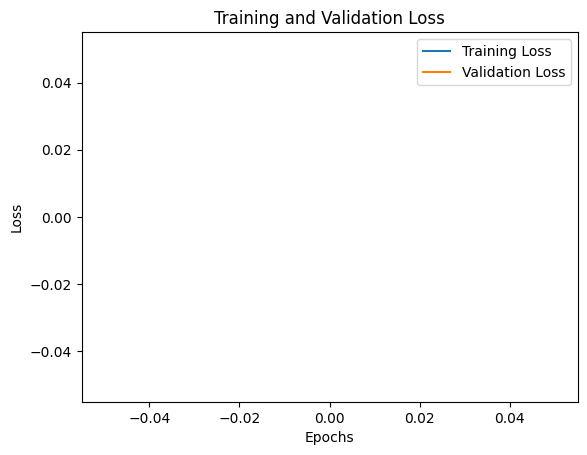

In [74]:
# Generate a sequence of integers to represent the epoch numbers
#epochs = range(1, iterations+1)

# Plot and label the training and validation loss values
plt.plot(J_train_history, label='Training Loss')
plt.plot(J_valid_history, label='Validation Loss')

# Add in a title and axes labels
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')

# Set the tick locations
#plt.xticks(np.arange(0, iterations+1, 2))

# Display the plot
plt.legend(loc='best')
plt.show()

In [75]:
def predict(X, w, b):
    # number of training examples
    m, n = X.shape
    p = np.zeros(m)

    for i in range(m):
        z_wb = 0
        # Loop over each feature
        for j in range(n):
            # Add the corresponding term to z_wb
            z_wb += X[i][j] * w[j]

        # Add bias term
        z_wb += b

        # Calculate the prediction for this example
        f_wb = sigmoid(z_wb)

        # Apply the threshold
        p[i] = f_wb >= 0.5

    return p

In [76]:
y_predicted = predict(x_train, w_final, b_final)

In [77]:
y_train.shape

(22318,)

In [78]:
y_train.reshape(-1).shape, y_predicted.shape

((22318,), (22318,))

In [79]:
(y_train.reshape(-1) == y_predicted).sum()

np.int64(9250)

In [80]:
y_train = y_train.reshape(-1)

In [81]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_train,
                                                                                                                     y_true=y_train,
                                                                                                                     y_predicted=y_predicted)

<ipython-input-45-b7187a4eccb2>:11: RuntimeWarning: invalid value encountered in scalar divide
  precision = true_positive / (true_positive + false_positive)


In [82]:
print(f"[TRAIN] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[TRAIN] Accuracy: 41.45% 
 Precision: nan% 
 Recall: 0.00% 
 F1 Score: nan% 
 Specificity: 100.00% 
 False Positive Rate: 0.00% 
 False Negative Rate: 100.00%


In [83]:
y_predicted_validation = predict(x_validation, w_final, b_final)

In [84]:
y_validation = y_validation.reshape(-1)

In [85]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_validation,
                                                                                                                     y_true=y_validation,
                                                                                                                     y_predicted=y_predicted_validation)

<ipython-input-45-b7187a4eccb2>:11: RuntimeWarning: invalid value encountered in scalar divide
  precision = true_positive / (true_positive + false_positive)


In [86]:
print(f"[VALID] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[VALID] Accuracy: 41.45% 
 Precision: nan% 
 Recall: 0.00% 
 F1 Score: nan% 
 Specificity: 100.00% 
 False Positive Rate: 0.00% 
 False Negative Rate: 100.00%


### Analyze the feature importance

<Axes: ylabel='Feature'>

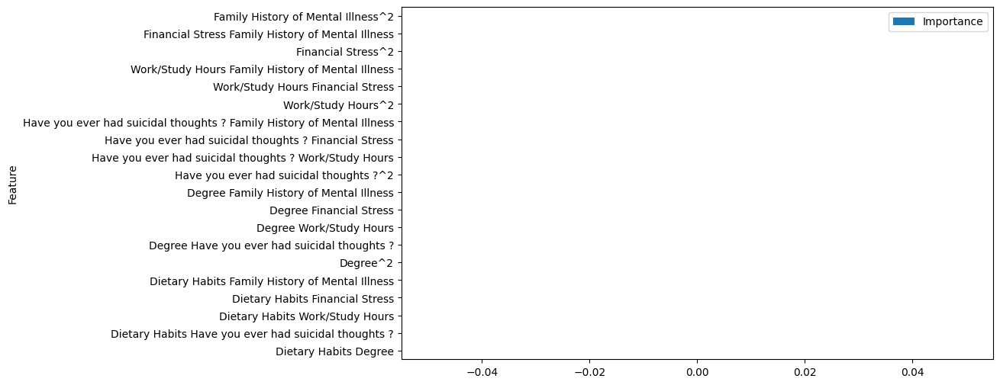

In [87]:
coefficients = copy.deepcopy(w_final)

feature_importance = pd.DataFrame({'Feature': x_data.columns.values, 'Importance': np.abs(coefficients)})
feature_importance = feature_importance.sort_values('Importance', ascending=True)
feature_importance.tail(20).plot(x='Feature', y='Importance', kind='barh', figsize=(10, 6))

#### For example most important feature is obtained by multipling two features: Total day minutes and Customer service calls

### Decision Tree
#### Specialized in learning non-linear data
#### No need for Normalization/Standardization
#### No need for Polynomial Feature Transformation

In [88]:
x_data = data.drop(columns=['Depression'])

### Split data into training and validation datasets: Default 80% train, 20% validation

In [89]:
x_train, x_validation, y_train, y_validation = train_test_split(x_data, y_data, test_size=0.2, random_state=42, stratify=y_data)

In [90]:
x_train = x_train.to_numpy()
x_validation = x_validation.to_numpy()
y_train = y_train.to_numpy()
y_validation = y_validation.to_numpy()

### Visualize how one sample looks like

In [91]:
x_train[0]

array([1.10738e+05, 0.00000e+00, 1.80000e+01, 3.80000e+01, 1.10000e+01,
       3.00000e+00, 0.00000e+00, 9.96000e+00, 5.00000e+00, 0.00000e+00,
       1.00000e+00, 0.00000e+00, 1.10000e+01, 1.00000e+00, 2.00000e+00,
       4.00000e+00, 1.00000e+00])

### Visualize the nuber of training samples and number of validation samples

In [92]:
len(y_train), len(y_validation)

(22318, 5580)

### Visualize the number of no churn vs churn samples in training dataset

#### Having 85.8% samples with no churn and 14.2% samples with churn in our dataset
#### So we have a ratio of 6 no churn samples to 1 churn sample
#### Our training and validation dataset should respect this ratio approximately

In [93]:
np.unique(y_train, return_counts=True)

(array([0, 1], dtype=int8), array([ 9250, 13068]))

#### 456 samples of 0 (no churn) and 78 samples of 1 (churn)
#### 78 * 6 = 468

### Visualize the number of no churn vs churn samples in validation dataset

#### 116 samples of 0 (no churn) and 17 samples of 1 (churn)
#### 17 * 6 = 102

In [94]:
np.unique(y_validation, return_counts=True)

(array([0, 1], dtype=int8), array([2313, 3267]))

In [95]:
from sklearn.tree import DecisionTreeClassifier, export_text
from sklearn.metrics import accuracy_score

### Decision Tree Code and Implementation

#### Declare Decision Tree with corresponding Hyperparameters

In [96]:
classifier = DecisionTreeClassifier(criterion='entropy', min_samples_split=2, max_depth=5)

In [97]:
type(x_train)

numpy.ndarray

#### Train the Decision Tree

In [98]:
classifier.fit(x_train, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=5)

#### Predict on the training dataset

In [99]:
y_predicted = classifier.predict(x_train)
y_predicted = np.array(y_predicted)

### Display training metrics

In [100]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_train,
                                                                                                                     y_true=y_train.reshape(-1),
                                                                                                                     y_predicted=y_predicted)

In [101]:
print(f"[TRAIN] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[TRAIN] Accuracy: 82.94% 
 Precision: 83.36% 
 Recall: 88.53% 
 F1 Score: 85.87% 
 Specificity: 75.04% 
 False Positive Rate: 24.96% 
 False Negative Rate: 11.47%


### Display validation metrics

In [102]:
y_predicted_valid = classifier.predict(x_validation)
y_predicted_valid = np.array(y_predicted_valid)

In [103]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_validation,
                                                                                                                     y_true=y_validation.reshape(-1),
                                                                                                                     y_predicted=y_predicted_valid)

In [104]:
print(f"[VALID] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[VALID] Accuracy: 82.31% 
 Precision: 82.52% 
 Recall: 88.55% 
 F1 Score: 85.43% 
 Specificity: 73.50% 
 False Positive Rate: 26.50% 
 False Negative Rate: 11.45%


### Display Decision Tree and Learned rules by the Tree

In [105]:
list(x_data.columns)

['id',
 'Gender',
 'Age',
 'City',
 'Profession',
 'Academic Pressure',
 'Work Pressure',
 'CGPA',
 'Study Satisfaction',
 'Job Satisfaction',
 'Sleep Duration',
 'Dietary Habits',
 'Degree',
 'Have you ever had suicidal thoughts ?',
 'Work/Study Hours',
 'Financial Stress',
 'Family History of Mental Illness']

In [106]:
from sklearn.tree import plot_tree


In [107]:
fig, axes = plt.subplots(nrows = 1,ncols = 1, figsize=(70,50), dpi=300)
plot_tree(classifier, filled=True, fontsize=20, feature_names=list(x_data.columns),rounded=True, ax=axes)
plt.savefig('decisionTree.png')

In [108]:
text_representation = export_text(classifier, feature_names=list(x_data.columns), class_names=['No Depression', 'Depression'])
print(text_representation)

|--- Have you ever had suicidal thoughts ? <= 0.50
|   |--- Academic Pressure <= 3.50
|   |   |--- Financial Stress <= 2.50
|   |   |   |--- Academic Pressure <= 2.50
|   |   |   |   |--- Work/Study Hours <= 6.50
|   |   |   |   |   |--- class: No Depression
|   |   |   |   |--- Work/Study Hours >  6.50
|   |   |   |   |   |--- class: No Depression
|   |   |   |--- Academic Pressure >  2.50
|   |   |   |   |--- Dietary Habits <= 2.00
|   |   |   |   |   |--- class: No Depression
|   |   |   |   |--- Dietary Habits >  2.00
|   |   |   |   |   |--- class: No Depression
|   |   |--- Financial Stress >  2.50
|   |   |   |--- Academic Pressure <= 1.50
|   |   |   |   |--- Dietary Habits <= 2.50
|   |   |   |   |   |--- class: No Depression
|   |   |   |   |--- Dietary Habits >  2.50
|   |   |   |   |   |--- class: No Depression
|   |   |   |--- Academic Pressure >  1.50
|   |   |   |   |--- Age <= 24.50
|   |   |   |   |   |--- class: No Depression
|   |   |   |   |--- Age >  24.50
|   |   

In [109]:
from sklearn.tree import _tree

In [110]:
def get_rules(tree, feature_names, class_names):
    tree_ = tree.tree_
    feature_name = [
        feature_names[i] if i != _tree.TREE_UNDEFINED else "undefined!"
        for i in tree_.feature
    ]

    paths = []
    path = []

    def recurse(node, path, paths):

        if tree_.feature[node] != _tree.TREE_UNDEFINED:
            name = feature_name[node]
            threshold = tree_.threshold[node]
            p1, p2 = list(path), list(path)
            p1 += [f"({name} <= {np.round(threshold, 3)})"]
            recurse(tree_.children_left[node], p1, paths)
            p2 += [f"({name} > {np.round(threshold, 3)})"]
            recurse(tree_.children_right[node], p2, paths)
        else:
            path += [(tree_.value[node], tree_.n_node_samples[node])]
            paths += [path]

    recurse(0, path, paths)

    # sort by samples count
    samples_count = [p[-1][1] for p in paths]
    ii = list(np.argsort(samples_count))
    paths = [paths[i] for i in reversed(ii)]

    rules = []
    for path in paths:
        rule = "if "

        for p in path[:-1]:
            if rule != "if ":
                rule += " and "
            rule += str(p)
        rule += " then "
        if class_names is None:
            rule += "response: "+str(np.round(path[-1][0][0][0],3))
        else:
            classes = path[-1][0][0]
            l = np.argmax(classes)
            rule += f"class: {class_names[l]} (proba: {np.round(100.0*classes[l]/np.sum(classes),2)}%)"
        rule += f" | based on {path[-1][1]:,} samples"
        rules += [rule]

    return rules

In [111]:
rules = get_rules(classifier, feature_names=list(x_data.columns), class_names=['No Depression', 'Depression'])
for r in rules:
    print(r)

if (Have you ever had suicidal thoughts ? > 0.5) and (Academic Pressure > 2.5) and (Financial Stress > 2.5) and (Academic Pressure > 3.5) and (Dietary Habits > 0.5) then class: Depression (proba: 96.51%) | based on 3,897 samples
if (Have you ever had suicidal thoughts ? > 0.5) and (Academic Pressure > 2.5) and (Financial Stress > 2.5) and (Academic Pressure <= 3.5) and (Age <= 29.5) then class: Depression (proba: 91.02%) | based on 2,249 samples
if (Have you ever had suicidal thoughts ? <= 0.5) and (Academic Pressure <= 3.5) and (Financial Stress > 2.5) and (Academic Pressure > 1.5) and (Age > 24.5) then class: No Depression (proba: 80.61%) | based on 1,171 samples
if (Have you ever had suicidal thoughts ? > 0.5) and (Academic Pressure > 2.5) and (Financial Stress > 2.5) and (Academic Pressure > 3.5) and (Dietary Habits <= 0.5) then class: Depression (proba: 90.31%) | based on 1,115 samples
if (Have you ever had suicidal thoughts ? > 0.5) and (Academic Pressure > 2.5) and (Financial St